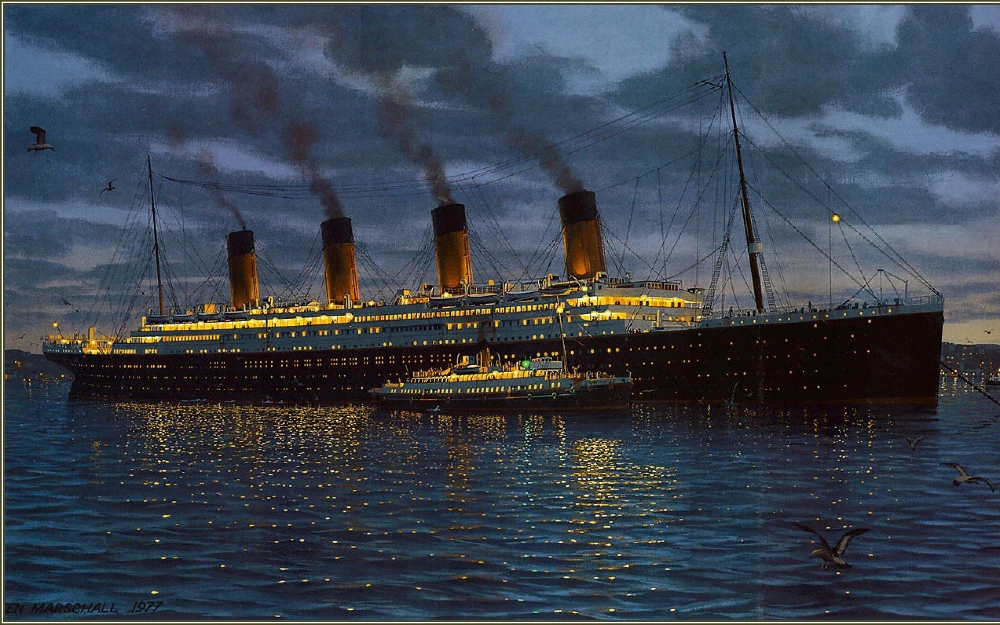

# GOAL OF NOTEBOOK

### Statistical Analysis 
how some groups of people survived more then others
### Depth Visualization (EDA)
with EDA we will do visualization and storytelling
### Machine Lerning Model
used ML algorithms for classification model to predict chances of passengers survival



In [1]:
import pandas as pd 

train = pd.read_csv('train.csv')
test  = pd.read_csv('test.csv')

In [2]:
train.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [3]:
test.head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S


In [4]:
train.shape

(891, 12)

In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


## `Types of data`

**Nominal**
variables that have two or more categories, but which do not have an intrinsic order
> - **Cabin**
   > - **Embarked**(Port of Embarkation)
            C(Cherbourg)
            Q(Queenstown) 
            S(Southampton)
            
**Dichotomous** Nominal variable with two categories
> - **sex**
         Male Female
         
         
**Ordinal** Variable that have ordered by rank
> -**Pclass**
        Upper
        Middle
        Lower
        
**Numeric** 
> -**Discrete**
        Passenger ID
        SibSp
        Parch
        Survived
        
> -**Continous**
        Age
        Fare
       
**Text**
> -**Ticket**
> -**Name**


In [6]:
%%HTML
<div class='tableauPlaceholder' id='viz1516349898238' style='position: relative'><noscript><a href='#'><img alt='An Overview of Titanic Training Dataset ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Ti&#47;Titanic_data_mining&#47;Dashboard1&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='Titanic_data_mining&#47;Dashboard1' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Ti&#47;Titanic_data_mining&#47;Dashboard1&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1516349898238');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

# `Cleaning data`

In [7]:
passengerid = test.PassengerId

### Null Values

In [8]:
train.isna().sum().sort_values(ascending=False)

Cabin          687
Age            177
Embarked         2
Fare             0
Ticket           0
Parch            0
SibSp            0
Sex              0
Name             0
Pclass           0
Survived         0
PassengerId      0
dtype: int64

In [9]:
test.isna().sum().sort_values(ascending=False)

Cabin          327
Age             86
Fare             1
Embarked         0
Ticket           0
Parch            0
SibSp            0
Sex              0
Name             0
Pclass           0
PassengerId      0
dtype: int64

### Steps 
   > -**Embarked**
   
   > -**Cabin**
   
   > -**Fare**
   
   > -**Age**

### **Embareked** has only two value null

In [10]:
train.Embarked.value_counts()

S    644
C    168
Q     77
Name: Embarked, dtype: int64

In [11]:
train[train.Embarked.isnull()]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
61,62,1,1,"Icard, Miss. Amelie",female,38.0,0,0,113572,80.0,B28,NaN
829,830,1,1,"Stone, Mrs. George Nelson (Martha Evelyn)",female,62.0,0,0,113572,80.0,B28,NaN


- we can feel value with S because it is most frequent 
- Lets go further more to feel it

- `If we closely look to data we will observe they have same value of Fare and belong to P1 class`

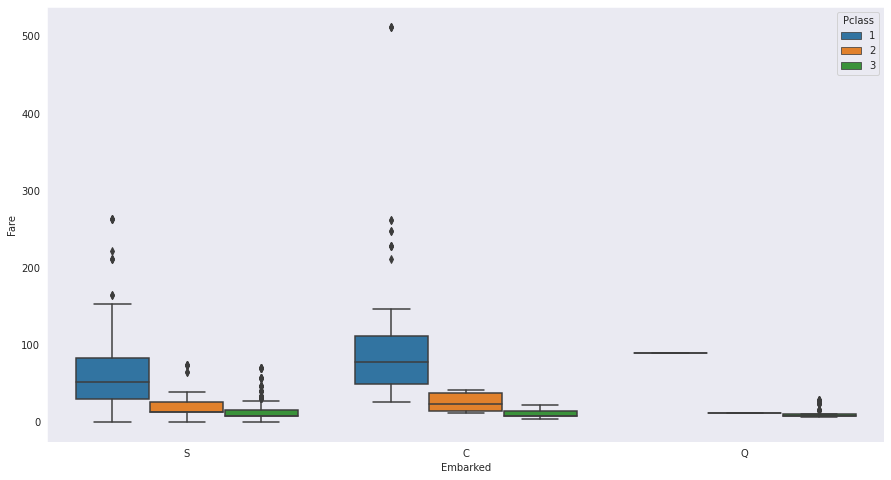

In [12]:
import seaborn as sns 
import matplotlib.pyplot as plt 
plt.figure(figsize=(15,8))
sns.set_style('dark')
sns.boxplot(x='Embarked',y='Fare',hue='Pclass',data=train)

`Here, in both training set and test set, the average fare closest to 80 are in the C Embarked values where pclass is 1. So, let's fill in the missing values as C`

In [13]:
train.Embarked.fillna("C", inplace=True)

### Cabin

In [14]:
train.Cabin.isna().sum()/len(train.Cabin)

0.7710437710437711

`We Can see approx 78% data is missing we have two choices`
- we can either get rid of the whole feature, or
- we can think little and find an appropriate way to put them in use. For example, We may say passengers with cabin record had a higher socio-economic-status then others. We may also say passengers with cabin record were more likely to be taken into consideration when loading into the boat.

In [15]:
train.Cabin.value_counts()

G6             4
C23 C25 C27    4
B96 B98        4
F2             3
E101           3
              ..
B102           1
C50            1
E49            1
B69            1
B19            1
Name: Cabin, Length: 147, dtype: int64

In [16]:
survivers = train.Survived 

In [17]:
train.drop(["Survived"],axis=1, inplace=True)

In [18]:
all_data = pd.concat([train,test],ignore_index=False)

In [19]:
#lets assign null values with N for now
all_data.Cabin.fillna("N", inplace=True)

In [20]:
#as we see in Cabin all value start with some alphabate
all_data.Cabin = [i[0] for i in all_data.Cabin]

In [21]:
all_data.Cabin.value_counts()

N    1014
C      94
B      65
D      46
E      41
A      22
F      21
G       5
T       1
Name: Cabin, dtype: int64

In [22]:
all_data.groupby("Cabin")['Fare'].mean().sort_values()

Cabin
G     14.205000
F     18.079367
N     19.132707
T     35.500000
A     41.244314
D     53.007339
E     54.564634
C    107.926598
B    122.383078
Name: Fare, dtype: float64

In [23]:
# yes now we get info
#Here remember we will not take N because N is missing value we have just given name to it

def cabin_value(i):
    a=0
    if i<16:
        a="G"
    elif i>=16 and i<27:
        a="F"
    elif i>=27 and i<38:
        a="T"
    elif i>=38 and i<47:
        a="A"
    elif i>= 47 and i<53:
        a="E"
    elif i>= 53 and i<54:
        a = "D"
    elif i>=54 and i<116:
        a = 'C'
    else:
        a = "B"
    return a    

In [24]:
with_N = all_data[all_data.Cabin == "N"]
without_N = all_data[all_data.Cabin != "N"]

In [25]:
with_N.head()

#look we have only value with N 

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,N,S
2,3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,N,S
4,5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,N,S
5,6,3,"Moran, Mr. James",male,NaN,0,0,330877,8.4583,N,Q
7,8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,21.0750,N,S


In [26]:
# we are applying to fare because we have taken mean of fare 
with_N['Cabin'] = with_N.Fare.apply(lambda x:cabin_value(x))

/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [27]:
with_N.head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,G,S
2,3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,G,S
4,5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,G,S
5,6,3,"Moran, Mr. James",male,NaN,0,0,330877,8.4583,G,Q
7,8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,21.0750,F,S


In [28]:
all_data = pd.concat([with_N,without_N],axis=0)

In [29]:
## PassengerId helps us separate train and test. 
all_data.sort_values(by = 'PassengerId', inplace=True)

In [30]:
### Separating train and test from all_data.
train = all_data[:891]
test = all_data[891:]


In [31]:
# adding saved target variable with train. 
train['Survived'] = survivers

/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


### Fare

In [32]:
test[test.Fare.isnull()]

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
152,1044,3,"Storey, Mr. Thomas",male,60.5,0,0,3701,NaN,B,S


- We can take the average of the Fare column to fill in the NaN value. 
- However, for learning and practicing, we will try something else. We can take the average of the values wherePclass is 3, Sex is male and Embarked is S

In [33]:
missing_value = test[(test.Pclass == 3) & 
                     (test.Embarked == "S") & 
                     (test.Sex == "male")].Fare.mean()
test.Fare.fillna(missing_value, inplace=True)

/home/ind/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:6245: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)


## Age

In [34]:
train.Age.isna().sum()/len(train.Age)

0.19865319865319866

We will take a different approach since ~20% data in the Age column is missing in both train and test dataset

# `Visualization and Feature Relations`

> **Assumptions**
    - Survive Gender < Survive Female
    - Lower Survive < Middle Survive < Upper Survive
    - Passenger with higher fare survived more that other passengers. This can be quite correlated with Pclass.
    
    
## Steps 

> **1)Sex and Survived**

> **2)Pclass and Survived**

> **3)Fare and Survived**

> **3)Age and Survived**


    
    

### Sex and Survived

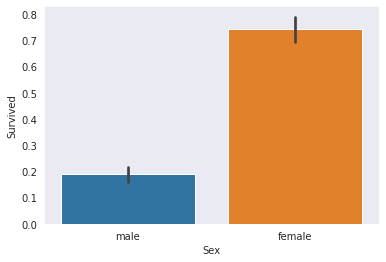

In [35]:
sns.barplot(x='Sex',y='Survived',data=train)

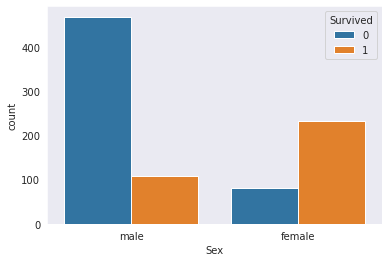

In [36]:
sns.countplot(x='Sex',hue='Survived',data=train)

`This count plot shows the actual distribution of male and female passengers that survived and did not survive. It shows that among all the females ~ 230 survived and ~ 70 did not survive. While among male passengers ~110 survived and ~480 did not survive.`

### Pcalss  and Survived

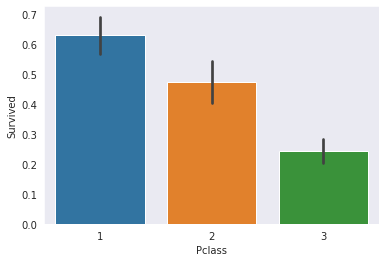

In [37]:
sns.barplot(x='Pclass',y='Survived',data=train)

- 63% first class passenger survived titanic tragedy, while
- 48% second class and
- only 24% third class passenger survived.

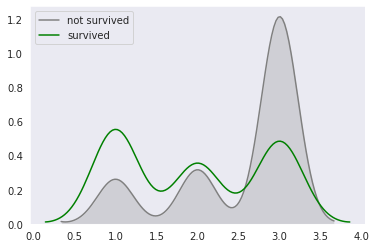

In [38]:
ax = sns.kdeplot(train.Pclass[train.Survived==0],
           color='gray',label='not survived',shade=True)
ax = sns.kdeplot(train.Pclass[train.Survived==1],
           color='g',label='survived')

### Fare and Survived

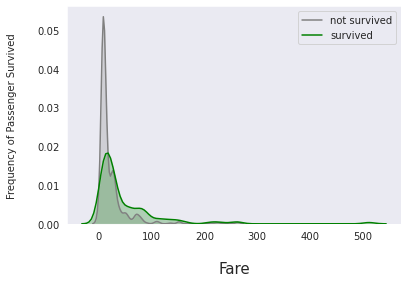

In [39]:
ax=sns.kdeplot(train.loc[(train['Survived'] == 0),'Fare'] , color='gray',shade=True,label='not survived')
ax=sns.kdeplot(train.loc[(train['Survived'] == 1),'Fare'] , color='g',shade=True, label='survived')
plt.ylabel("Frequency of Passenger Survived", fontsize = 10, labelpad = 20)
plt.xlabel("Fare", fontsize = 15, labelpad = 20);

- The spike in the plot under 100 dollar represents that a lot of passengers who bought the ticket within that range did not survive.

### Age and Survived


Text(0, 0.5, 'Frequency')

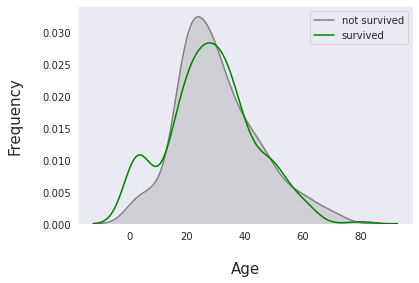

In [40]:
ax=sns.kdeplot(train.loc[(train['Survived'] == 0),'Age'] , color='gray',shade=True,label='not survived')
ax=sns.kdeplot(train.loc[(train['Survived'] == 1),'Age'] , color='g', label='survived')
plt.xlabel("Age", fontsize = 15, labelpad = 20)
plt.ylabel('Frequency', fontsize = 15, labelpad= 20)

# `Statistical Analysics`

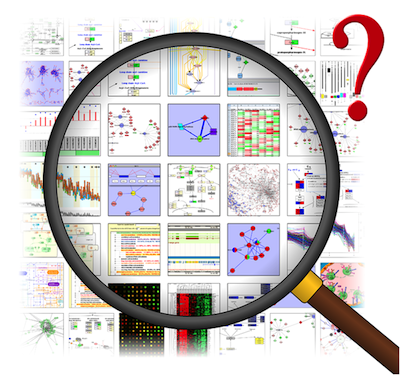

## Overview of data

In [41]:
train.describe()

,PassengerId,Pclass,Age,SibSp,Parch,Fare,Survived
count,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000,891.000000
mean,446.000000,2.308642,29.699118,0.523008,0.381594,32.204208,0.383838
std,257.353842,0.836071,14.526497,1.102743,0.806057,49.693429,0.486592
min,1.000000,1.000000,0.420000,0.000000,0.000000,0.000000,0.000000
25%,223.500000,2.000000,20.125000,0.000000,0.000000,7.910400,0.000000
50%,446.000000,3.000000,28.000000,0.000000,0.000000,14.454200,0.000000
75%,668.500000,3.000000,38.000000,1.000000,0.000000,31.000000,1.000000
max,891.000000,3.000000,80.000000,8.000000,6.000000,512.329200,1.000000


In [42]:
# Overview(Survived vs non survied)
survived_summary = train.groupby("Survived")
survived_summary.mean().reset_index()

,Survived,PassengerId,Pclass,Age,SibSp,Parch,Fare
0,0,447.016393,2.531876,30.626179,0.553734,0.329690,22.117887
1,1,444.368421,1.950292,28.343690,0.473684,0.464912,48.395408


In [43]:
gender = {'male': 1,'female': 0}
train.Sex = [gender[item] for item in train.Sex] 
test.Sex = [gender[item] for item in test.Sex]
survived_summary = train.groupby("Sex")
survived_summary.mean().reset_index()

/home/ind/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:5303: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


,Sex,PassengerId,Pclass,Age,SibSp,Parch,Fare,Survived
0,0,431.028662,2.159236,27.915709,0.694268,0.649682,44.479818,0.742038
1,1,454.147314,2.389948,30.726645,0.429809,0.235702,25.523893,0.188908


In [44]:
survived_summary = train.groupby("Pclass")
survived_summary.mean().reset_index()

,Pclass,PassengerId,Sex,Age,SibSp,Parch,Fare,Survived
0,1,461.597222,0.564815,38.233441,0.416667,0.356481,84.154687,0.629630
1,2,445.956522,0.586957,29.877630,0.402174,0.380435,20.662183,0.472826
2,3,439.154786,0.706721,25.140620,0.615071,0.393075,13.675550,0.242363


## Correlation Matrix and Heatmap

In [45]:
pd.DataFrame(abs(train.corr()['Survived']).sort_values(ascending=False))

,Survived
Survived,1.000000
Sex,0.543351
Pclass,0.338481
Fare,0.257307
Parch,0.081629
Age,0.077221
SibSp,0.035322
PassengerId,0.005007


`Sex is the most important correlated feature with Survived(dependent variable) feature followed by Pclass.`

In [46]:
## get the most important variables. 
corr = train.corr()**2
corr.Survived.sort_values(ascending=False)

Survived       1.000000
Sex            0.295231
Pclass         0.114569
Fare           0.066207
Parch          0.006663
Age            0.005963
SibSp          0.001248
PassengerId    0.000025
Name: Survived, dtype: float64

`Squaring the correlation feature not only gives on positive correlations but also amplifies the relationships.`

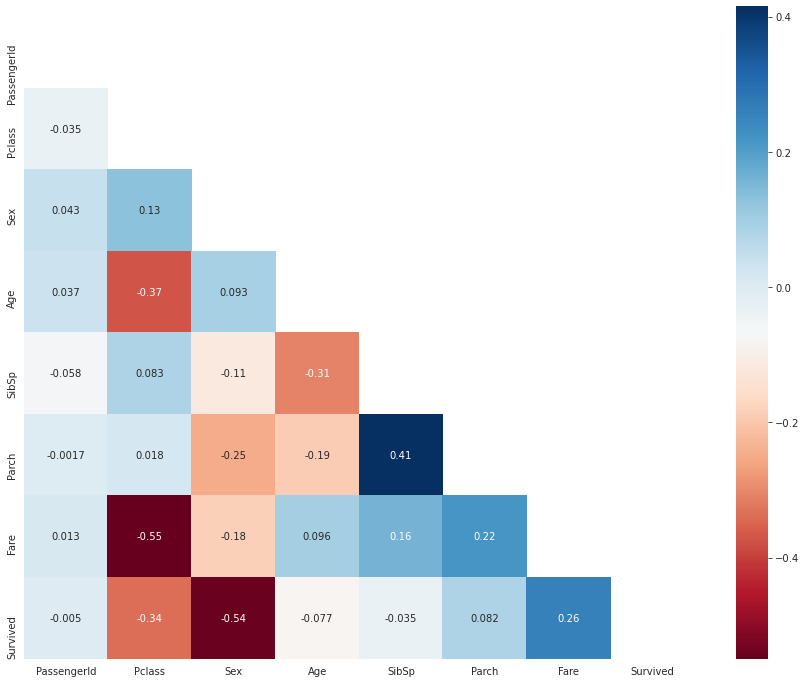

In [47]:
import numpy as np 
mask = np.zeros_like(train.corr(),dtype=np.bool)
mask[np.triu_indices_from(mask)] =  True
sns.set_style('whitegrid')
plt.subplots(figsize = (15,12))

sns.heatmap(train.corr(),annot=True,mask=mask,cmap='RdBu')

#### Positive Correlation

> **Fare and Survived = 0.26** This relationship reveals that the passenger who paid more money for their ticket were more likely to survive. 

#### Negative Correlation Features:¶
> **Fare and Pclass: -0.6** This can also be explained by saying that first class passenger had a better chance of surviving than the second or the third and so on.


> **Sex and Survived: -0.55**

> **Pclass and Survived: -0.33**

## Hypothesis Testing

> **Null Hypothesis** There is no difference in the survival rate between the male and female passengers
or
**male mean >= female mean**

> **Alternate Hypothesis** here is a difference in the survival rate between the male and female passengers
or 
**male mean < female mean**


> **Determine the test statistics**
This will be a two-tailed test since the difference between male and female passenger in the survival rate could be higher or lower than 0. Since we do not know the standard deviation( σ ) and n is small, we will use the t-distribution.

> **significance level alpha = 95%**

> **Computing T-value and P-value**

In [48]:
male_mean = train[train['Sex'] == 1].Survived.mean()

female_mean = train[train['Sex'] == 0].Survived.mean()

print(f'Male Mean = {male_mean}')
print(f'Female Mean = {female_mean}')
print(f'Differance = {female_mean - male_mean}')


Male Mean = 0.18890814558058924
Female Mean = 0.7420382165605095
Differance = 0.5531300709799203


`It is impossible for us at this point to know the population means of survival for male and females. Situation like this calls for a statistical approach. We will use the sampling distribution approach to do the test. let's take 50 random sample of male and female from our train data.`

In [49]:
import random 
male = train[train['Sex']==1]
female = train[train['Sex']==0]

m_mean_sample = []
f_mean_sample = []

for i in range(50):
    m_mean_sample.append(np.mean(random.sample(list(male['Survived']),50)))
    f_mean_sample.append(np.mean(random.sample(list(female['Survived']),50,)))

In [50]:
print(f'Mean of Male Sample = {np.mean(m_mean_sample)}')
print(f'Mean of Female Sample = {np.mean(f_mean_sample)}')
print(f'Differance of M_F MEan Sample = {np.mean(f_mean_sample) - np.mean(m_mean_sample)}')

Mean of Male Sample = 0.19319999999999996
Mean of Female Sample = 0.7492
Differance of M_F MEan Sample = 0.556


In [51]:
from scipy.stats import ttest_ind, ttest_ind_from_stats
male_data = np.array(m_mean_sample)
female_data = np.array(f_mean_sample)

t2, p2 = ttest_ind(male_data,female_data,equal_var=False)
print(f't-value {t2}  p-value{p2}')

t-value -46.238019784599466  p-value1.4273760589694155e-66


In [52]:
4.6985695880807765e-76 < 0.05 

True

> **Compare P-value with α ** It looks like the p-value is very small compared to our significance level( α )of 0.05. Our observation sample is statistically significant. Therefore alternative hypothesis is valid, which is "There is a significant difference in the survival rate between the male and female passengers."


# `Feature Engineering`
### Name

In [53]:
train['name_lenght'] = [len(i) for i in train.Name]
test['name_lenght'] = [len(i) for i in test.Name]

/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [54]:
def name_length_g(size):
    a = ''
    if size<= 18:
        a='short'
    elif size <=34:
        a='medium'
    elif size<=45:
        a='good'
    else:
        a='long'
    return a 

train['Length_group'] = train['name_lenght'].map(name_length_g)
test['Length_group'] = test['name_lenght'].map(name_length_g)

/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [55]:
#group_names = ['short', 'medium', 'good', 'long']
#train['name_len_group'] = pd.cut(train['name_length'], bins = 4, labels=group_names)

In [56]:
## get the title from the name
train["title"] = [i.split('.')[0] for i in train.Name]
train["title"] = [i.split(',')[1] for i in train.title]

/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [57]:
train.title.unique()

array([' Mr', ' Mrs', ' Miss', ' Master', ' Don', ' Rev', ' Dr', ' Mme',
       ' Ms', ' Major', ' Lady', ' Sir', ' Mlle', ' Col', ' Capt',
       ' the Countess', ' Jonkheer'], dtype=object)

In [58]:
train.title = train.title.apply(lambda x: x.strip())

/home/ind/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:5303: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [59]:
train.title.value_counts()

Mr              517
Miss            182
Mrs             125
Master           40
Dr                7
Rev               6
Major             2
Mlle              2
Col               2
Don               1
Lady              1
Mme               1
the Countess      1
Ms                1
Capt              1
Sir               1
Jonkheer          1
Name: title, dtype: int64

In [60]:
# ## train Data
# train["title"] = [i.replace('Ms', 'Miss') for i in train.title]
# train["title"] = [i.replace('Mlle', 'Miss') for i in train.title]
# train["title"] = [i.replace('Mme', 'Mrs') for i in train.title]
# train["title"] = [i.replace('Dr', 'rare') for i in train.title]
# train["title"] = [i.replace('Col', 'rare') for i in train.title]
# train["title"] = [i.replace('Major', 'rare') for i in train.title]
# train["title"] = [i.replace('Don', 'rare') for i in train.title]
# train["title"] = [i.replace('Jonkheer', 'rare') for i in train.title]
# train["title"] = [i.replace('Sir', 'rare') for i in train.title]
# train["title"] = [i.replace('Lady', 'rare') for i in train.title]
# train["title"] = [i.replace('Capt', 'rare') for i in train.title]
# train["title"] = [i.replace('the Countess', 'rare') for i in train.title]
# train["title"] = [i.replace('Rev', 'rare') for i in train.title]

#not effective way

In [61]:
def name_convert(feature):
    result = ''
    if feature in ['the Countess','Capt','Lady','Sir','Jonkheer','Don','Major','Col', 'Rev', 'Dona', 'Dr']:
        result = 'rare'
    elif feature in ['Ms','Mlle']:
        result = 'Miss'
        result = 'Miss'
    elif feature == 'Mme':
        result = 'Mrs'
    else:
        result = feature
    return result 

In [62]:

train.title = train.title.map(name_convert)

In [63]:
train.head(1)

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,name_lenght,Length_group,title
0,1,3,"Braund, Mr. Owen Harris",1,22.0,1,0,A/5 21171,7.25,G,S,0,23,medium,Mr


In [64]:
test['title'] = [i.split('.')[0].split(',')[1].strip() for i in test.Name]

/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [65]:
test.title = test.title.map(name_convert)

/home/ind/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:5303: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [66]:
print(train.title.unique())
print(test.title.unique())

['Mr' 'Mrs' 'Miss' 'Master' 'rare']
['Mr' 'Mrs' 'Miss' 'Master' 'rare']


### SibSp Parch

In [67]:
## Family_size seems like a good feature to create
train['family_size'] = train.SibSp + train.Parch+1
test['family_size'] = test.SibSp + test.Parch+1 

/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [68]:
def family_group(size):
    """
    This funciton groups(loner, small, large) family based on family size
    """
    
    a = ''
    if (size <= 1):
        a = 'loner'
    elif (size <= 4):
        a = 'small'
    else:
        a = 'large'
    return a


In [69]:
## apply the family_group function in family_size
train['family_group'] = train['family_size'].map(family_group)
test['family_group'] = test['family_size'].map(family_group)


/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [70]:
train['is_alone'] = [1 if i<2 else 0 for i in train.family_size]
test['is_alone'] = [1 if i<2 else 0 for i in test.family_size]

/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


### ticket

In [71]:
train.Ticket.value_counts().sample(10)

2671                 1
7267                 1
17464                1
C.A. 34651           3
349204               1
349254               1
237798               1
SOTON/O.Q. 392078    1
7552                 1
31028                1
Name: Ticket, dtype: int64

In [72]:
train.drop(['Ticket'], axis=1, inplace=True)

test.drop(['Ticket'], axis=1, inplace=True)

/home/ind/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


### Fare

In [73]:
## Calculating fare based on family size. 
train['calculated_fare'] = train.Fare/train.family_size
test['calculated_fare'] = test.Fare/test.family_size

/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [74]:
def fare_group(fare):
    """
    This function creates a fare group based on the fare provided
    """
    
    a= ''
    if fare <= 4:
        a = 'Very_low'
    elif fare <= 10:
        a = 'low'
    elif fare <= 20:
        a = 'mid'
    elif fare <= 45:
        a = 'high'
    else:
        a = "very_high"
    return a

In [75]:
train['fare_group'] = train['calculated_fare'].map(fare_group)
test['fare_group'] = test['calculated_fare'].map(fare_group)


/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/home/ind/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


### PassengerID

In [76]:
train.drop(['PassengerId'], axis=1, inplace=True)

test.drop(['PassengerId'], axis=1, inplace=True)

## Creating dummy variables

In [77]:
train = pd.get_dummies(train, columns=['title',"Pclass", 'Cabin','Embarked','Length_group', 'family_group', 'fare_group'], drop_first=False)
test = pd.get_dummies(test, columns=['title',"Pclass",'Cabin','Embarked','Length_group', 'family_group', 'fare_group'], drop_first=False)
train.drop(['family_size','Name', 'Fare','name_lenght'], axis=1, inplace=True)
test.drop(['Name','family_size',"Fare",'name_lenght'], axis=1, inplace=True)


In [78]:
train.head()

,Sex,Age,SibSp,Parch,Survived,is_alone,calculated_fare,title_Master,title_Miss,title_Mr,...,Length_group_medium,Length_group_short,family_group_large,family_group_loner,family_group_small,fare_group_Very_low,fare_group_high,fare_group_low,fare_group_mid,fare_group_very_high
0,1,22.0,1,0,0,0,3.62500,0,0,1,...,1,0,0,0,1,1,0,0,0,0
1,0,38.0,1,0,1,0,35.64165,0,0,0,...,0,0,0,0,1,0,1,0,0,0
2,0,26.0,0,0,1,1,7.92500,0,1,0,...,1,0,0,1,0,0,0,1,0,0
3,0,35.0,1,0,1,0,26.55000,0,0,0,...,0,0,0,0,1,0,1,0,0,0
4,1,35.0,0,0,0,1,8.05000,0,0,1,...,1,0,0,1,0,0,0,1,0,0


### Age

In [79]:
train.Age.isna().sum()

177

In [80]:
## rearranging the columns so that I can easily use the dataframe to predict the missing age values. 
train = pd.concat([train[["Survived", "Age", "Sex","SibSp","Parch"]], train.loc[:,"is_alone":]], axis=1)
test = pd.concat([test[["Age", "Sex"]], test.loc[:,"SibSp":]], axis=1)

In [81]:
from sklearn.ensemble import RandomForestRegressor

## writing a function that takes a dataframe with missing values and outputs it by filling the missing values. 
def completing_age(df):
    ## gettting all the features except survived
    age_df = df.loc[:,"Age":] 
    
    temp_train = age_df.loc[age_df.Age.notnull()] ## df with age values
    temp_test = age_df.loc[age_df.Age.isnull()] ## df without age values
    
    y = temp_train.Age.values ## setting target variables(age) in y 
    x = temp_train.loc[:, "Sex":].values
    
    rfr = RandomForestRegressor(n_estimators=1500, n_jobs=-1)
    rfr.fit(x, y)
    
    predicted_age = rfr.predict(temp_test.loc[:, "Sex":])
    
    df.loc[df.Age.isnull(), "Age"] = predicted_age
    

    return df

## Implementing the completing_age function in both train and test dataset. 
completing_age(train)
completing_age(test)

,Age,Sex,SibSp,Parch,is_alone,calculated_fare,title_Master,title_Miss,title_Mr,title_Mrs,...,Length_group_medium,Length_group_short,family_group_large,family_group_loner,family_group_small,fare_group_Very_low,fare_group_high,fare_group_low,fare_group_mid,fare_group_very_high
0,34.500000,1,0,0,1,7.829200,0,0,1,0,...,0,1,0,1,0,0,0,1,0,0
1,47.000000,0,1,0,0,3.500000,0,0,0,1,...,1,0,0,0,1,1,0,0,0,0
2,62.000000,1,0,0,1,9.687500,0,0,1,0,...,1,0,0,1,0,0,0,1,0,0
3,27.000000,1,0,0,1,8.662500,0,0,1,0,...,0,1,0,1,0,0,0,1,0,0
4,22.000000,0,1,1,0,4.095833,0,0,0,1,...,0,0,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
413,23.027324,1,0,0,1,8.050000,0,0,1,0,...,0,1,0,1,0,0,0,1,0,0
414,39.000000,0,0,0,1,108.900000,0,0,0,0,...,1,0,0,1,0,0,0,0,0,1
415,38.500000,1,0,0,1,7.250000,0,0,1,0,...,1,0,0,1,0,0,0,1,0,0
416,27.444081,1,0,0,1,8.050000,0,0,1,0,...,1,0,0,1,0,0,0,1,0,0


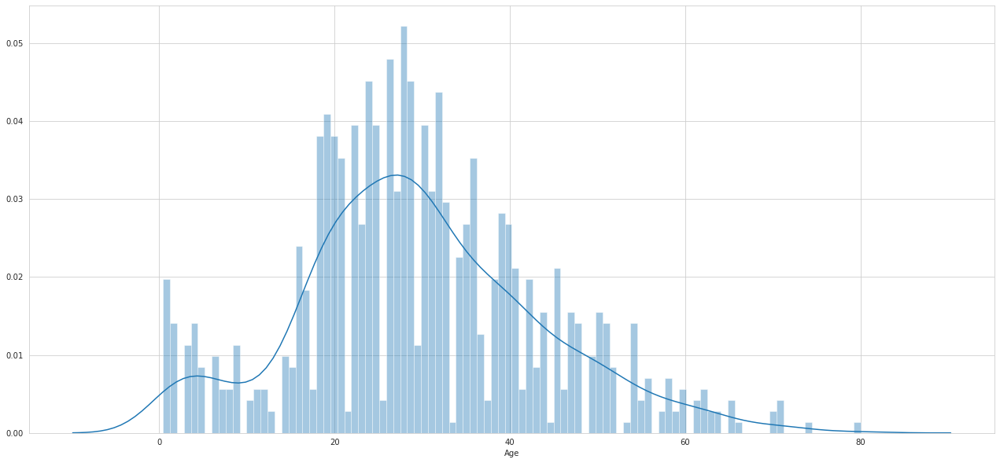

In [82]:
## Let's look at the his
plt.subplots(figsize = (22,10),)
sns.distplot(train.Age, bins = 100, kde = True, rug = False, norm_hist=False)

In [83]:
def age_group_fun(age):
    """
    This function creates a bin for age
    """
    a = ''
    if age <= 1:
        a = 'infant'
    elif age <= 4: 
        a = 'toddler'
    elif age <= 13:
        a = 'child'
    elif age <= 18:
        a = 'teenager'
    elif age <= 35:
        a = 'Young_Adult'
    elif age <= 45:
        a = 'adult'
    elif age <= 55:
        a = 'middle_aged'
    elif age <= 65:
        a = 'senior_citizen'
    else:
        a = 'old'
    return a

In [84]:
train['age_group'] = train['Age'].map(age_group_fun)
test['age_group'] = test['Age'].map(age_group_fun)


In [85]:
## Creating dummies for "age_group" feature. 
train = pd.get_dummies(train,columns=['age_group'], drop_first=True)
test = pd.get_dummies(test,columns=['age_group'], drop_first=True)

In [86]:
train.head()

,Survived,Age,Sex,SibSp,Parch,is_alone,calculated_fare,title_Master,title_Miss,title_Mr,...,fare_group_mid,fare_group_very_high,age_group_adult,age_group_child,age_group_infant,age_group_middle_aged,age_group_old,age_group_senior_citizen,age_group_teenager,age_group_toddler
0,0,22.0,1,1,0,0,3.62500,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,1,38.0,0,1,0,0,35.64165,0,0,0,...,0,0,1,0,0,0,0,0,0,0
2,1,26.0,0,0,0,1,7.92500,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,1,35.0,0,1,0,0,26.55000,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,35.0,1,0,0,1,8.05000,0,0,1,...,0,0,0,0,0,0,0,0,0,0


# Pre-Modeling

**Separating dependent and independent variables**

In [87]:

X = train.drop(['Survived'], axis = 1)
y = train["Survived"]

- **X_train, X_test, y_train, y_test**

- **X_train and y_train** first used to train the algorithm.
- **X_test** is used in that trained algorithms to predict outcomes.
- Once we get the outcomes, we compare it with **y_test**

In [88]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size = .33, random_state=0)

In [89]:
len(X_train)

596

In [90]:
len(X_test)

295

## Scaling

In [91]:
from sklearn.preprocessing import StandardScaler
st_scale = StandardScaler()

In [92]:
## transforming "train_x"
X_train = st_scale.fit_transform(X_train)
X_test = st_scale.transform(X_test)

## Logistic Regression

In [93]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_absolute_error,accuracy_score

In [94]:
log_reg = LogisticRegression(solver='liblinear',
                            penalty='l1',
                            random_state=42)

In [95]:
log_reg.fit(X_train,y_train)



LogisticRegression(penalty='l1', random_state=42, solver='liblinear')

In [96]:
y_pred = log_reg.predict(X_test)

## Evaluating Model
Evaluating a classification model
There are multiple ways to evaluate a classification model.

**Confusion Matrix.**

**ROC Curve**

**AUC Curve.**

In [97]:
from sklearn.metrics import classification_report, confusion_matrix
pd.DataFrame(confusion_matrix(y_test,y_pred),
             columns=['Pred Not Survived','Pred Survived'],
            index=["Not Survived","Survived"])

,Pred Not Survived,Pred Survived
Not Survived,156,28
Survived,25,86


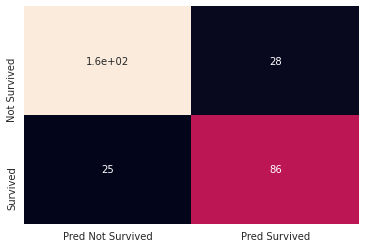

In [99]:
df = pd.DataFrame(confusion_matrix(y_test,y_pred),
             columns=['Pred Not Survived','Pred Survived'],
            index=["Not Survived","Survived"])
sns.heatmap(df,annot=True,cbar=False)

**True Positive(TP):86**

**True Negative(TN):156**

**False Positive(FP):25**

**False Negative(FN):28**

In [100]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.8203389830508474

In [101]:
from sklearn.metrics import recall_score
recall_score(y_test, y_pred)

0.7747747747747747

In [102]:
from sklearn.metrics import precision_score
precision_score(y_test, y_pred)

0.7543859649122807

In [103]:
from sklearn.metrics import classification_report, balanced_accuracy_score
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.85      0.85       184
           1       0.75      0.77      0.76       111

    accuracy                           0.82       295
   macro avg       0.81      0.81      0.81       295
weighted avg       0.82      0.82      0.82       295



### ROC and AUC

0.8659420289855073


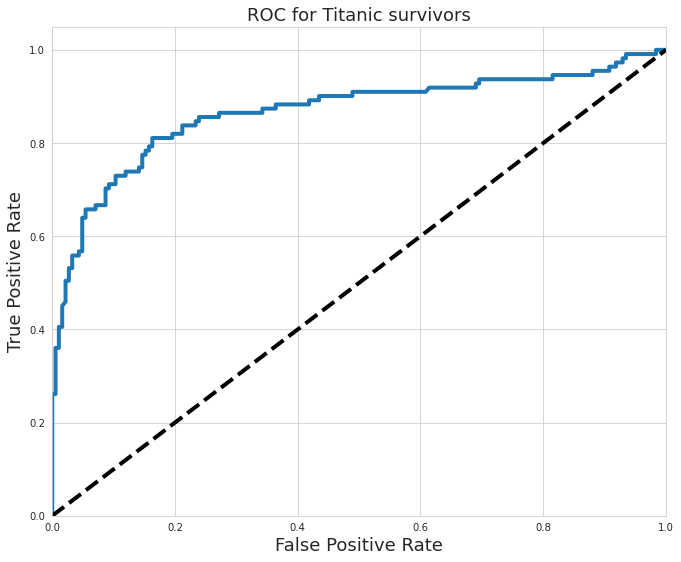

In [104]:
from sklearn.metrics import roc_curve, auc
#plt.style.use('seaborn-pastel')
y_score = log_reg.decision_function(X_test)

FPR, TPR, _ = roc_curve(y_test, y_score)
ROC_AUC = auc(FPR, TPR)
print (ROC_AUC)

plt.figure(figsize =[11,9])
plt.plot(FPR, TPR, label= 'ROC curve(area = %0.2f)'%ROC_AUC, linewidth= 4)
plt.plot([0,1],[0,1], 'k--', linewidth = 4)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate', fontsize = 18)
plt.ylabel('True Positive Rate', fontsize = 18)
plt.title('ROC for Titanic survivors', fontsize= 18)
plt.show()

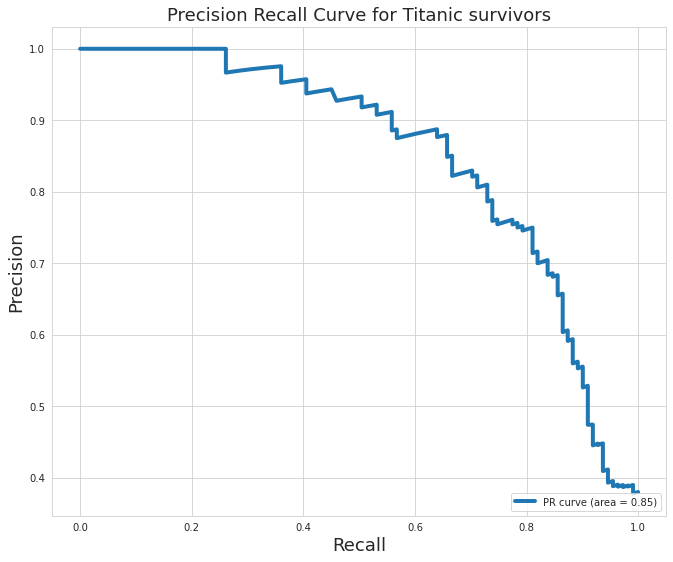

In [105]:
from sklearn.metrics import precision_recall_curve

y_score = log_reg.decision_function(X_test)

precision, recall, _ = precision_recall_curve(y_test, y_score)
PR_AUC = auc(recall, precision)

plt.figure(figsize=[11,9])
plt.plot(recall, precision, label='PR curve (area = %0.2f)' % PR_AUC, linewidth=4)
plt.xlabel('Recall', fontsize=18)
plt.ylabel('Precision', fontsize=18)
plt.title('Precision Recall Curve for Titanic survivors', fontsize=18)
plt.legend(loc="lower right")
plt.show()


### Using Cross Validation 
- Pros:

- Helps reduce variance.
- Expends models predictability.

In [106]:
from sklearn.model_selection import StratifiedShuffleSplit, cross_val_score

In [107]:
cv = StratifiedShuffleSplit(n_splits = 10, test_size = .25, random_state = 0) 

In [108]:
column_names = X.columns
sc = st_scale

In [109]:
accuracies = cross_val_score(LogisticRegression(solver='liblinear'),X,y,cv=cv)
print (f"Cross-Validation accuracy scores:{accuracies}")
print (f"Mean Cross-Validation accuracy score: {round(accuracies.mean(),5)}")

Cross-Validation accuracy scores:[0.79820628 0.81165919 0.80717489 0.86098655 0.83856502 0.80717489
 0.8161435  0.86995516 0.8161435  0.82959641]
Mean Cross-Validation accuracy score: 0.82556


In [110]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold

In [111]:
C_vals = [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,2,3,4,5,6,7,8,9,10,12,13,14,15,16,16.5,17,17.5,18]
penalties = ['l1','l2']
cv = StratifiedShuffleSplit(n_splits = 10, test_size = .25)
param = {'penalty': penalties, 'C': C_vals}

logreg = LogisticRegression(solver='liblinear')

grid = GridSearchCV(estimator=LogisticRegression(), 
                           param_grid = param,
                           scoring = 'accuracy',
                            n_jobs =-1,
                           cv = cv
                          )

grid.fit(X,y)

/home/ind/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


GridSearchCV(cv=StratifiedShuffleSplit(n_splits=10, random_state=None, test_size=0.25,
            train_size=None),
             estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1, 2, 3,
                               4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 16.5,
                               17, 17.5, 18],
                         'penalty': ['l1', 'l2']},
             scoring='accuracy')

In [112]:
## Getting the best of everything. 
print (grid.best_score_)
print (grid.best_params_)
print(grid.best_estimator_)

0.815695067264574
{'C': 18, 'penalty': 'l2'}
LogisticRegression(C=18)


In [113]:
### Using the best parameters from the grid-search.
logreg_grid = grid.best_estimator_
logreg_grid.score(X,y)

0.8383838383838383

# KNN 

In [114]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(metric='minkowski', p=2)
cv = StratifiedShuffleSplit(n_splits=10, test_size=.25, random_state=2)

accuracies = cross_val_score(knn, X,y, cv = cv, scoring='accuracy')
print ("Cross-Validation accuracy scores:{}".format(accuracies))
print ("Mean Cross-Validation accuracy score: {}".format(round(accuracies.mean(),3)))

Cross-Validation accuracy scores:[0.76681614 0.7309417  0.75336323 0.7309417  0.75336323 0.75784753
 0.71748879 0.77578475 0.72197309 0.73542601]
Mean Cross-Validation accuracy score: 0.744


In [115]:
## Search for an optimal value of k for KNN.
k_range = range(1,31)
k_scores = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X,y, cv = cv, scoring = 'accuracy')
    k_scores.append(scores.mean())
print("Accuracy scores are: {}\n".format(k_scores))
print ("Mean accuracy score: {}".format(np.mean(k_scores)))

Accuracy scores are: [0.7170403587443946, 0.7094170403587444, 0.7228699551569507, 0.7183856502242152, 0.7443946188340808, 0.7260089686098655, 0.7385650224215248, 0.7318385650224216, 0.7430493273542601, 0.7340807174887891, 0.7372197309417039, 0.7286995515695068, 0.7327354260089687, 0.7327354260089686, 0.7367713004484305, 0.736322869955157, 0.7340807174887892, 0.7354260089686099, 0.7309417040358744, 0.7260089686098654, 0.7251121076233183, 0.7188340807174888, 0.7228699551569507, 0.7134529147982063, 0.7125560538116592, 0.7089686098654708, 0.7062780269058295, 0.7098654708520179, 0.7071748878923767, 0.7067264573991032]

Mean accuracy score: 0.7249476831091181


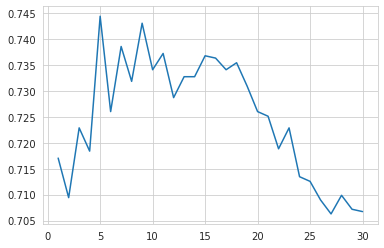

In [116]:
from matplotlib import pyplot as plt
plt.plot(k_range, k_scores)


In [117]:
from sklearn.model_selection import GridSearchCV
k_range = range(1,31)
weight_option = ['uniform','distance']
parmas = {'n_neighbors':k_range,
         'weights':weight_option}

cv = StratifiedShuffleSplit(n_splits=10,test_size=0.3,random_state=15)

grid = GridSearchCV(KNeighborsClassifier(),parmas,cv=cv,verbose=False,n_jobs=-1)
grid.fit(X,y)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=10, random_state=15, test_size=0.3,
            train_size=None),
             estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'n_neighbors': range(1, 31),
                         'weights': ['uniform', 'distance']},
             verbose=False)

In [118]:
print(grid.best_score_)
print(grid.best_params_)
print(grid.best_estimator_)

0.739179104477612
{'n_neighbors': 7, 'weights': 'distance'}
KNeighborsClassifier(n_neighbors=7, weights='distance')


In [119]:
### Using the best parameters from the grid-search.
knn_grid= grid.best_estimator_
knn_grid.score(X,y)

0.9887766554433222

In [120]:
from sklearn.model_selection import RandomizedSearchCV
## trying out multiple values for k
k_range = range(1,31)
## 
weights_options=['uniform','distance']
# 
param = {'n_neighbors':k_range, 'weights':weights_options}
## Using startifiedShufflesplit. 
cv = StratifiedShuffleSplit(n_splits=10, test_size=.30)
# estimator = knn, param_grid = param, n_jobs = -1 to instruct scikit learn to use all available processors. 
## for RandomizedSearchCV, 
grid = RandomizedSearchCV(KNeighborsClassifier(), param,cv=cv,verbose = False, n_jobs=-1, n_iter=40)
## Fitting the model. 
grid.fit(X,y)

RandomizedSearchCV(cv=StratifiedShuffleSplit(n_splits=10, random_state=None, test_size=0.3,
            train_size=None),
                   estimator=KNeighborsClassifier(), n_iter=40, n_jobs=-1,
                   param_distributions={'n_neighbors': range(1, 31),
                                        'weights': ['uniform', 'distance']},
                   verbose=False)

In [121]:
print (grid.best_score_)
print (grid.best_params_)
print(grid.best_estimator_)


0.7470149253731343
{'weights': 'distance', 'n_neighbors': 7}
KNeighborsClassifier(n_neighbors=7, weights='distance')


In [122]:
### Using the best parameters from the grid-search.
knn_ran_grid = grid.best_estimator_
knn_ran_grid.score(X,y)

0.9887766554433222

# Gaussian

In [123]:
# Gaussian Naive Bayes
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score

gaussian = GaussianNB()
gaussian.fit(X, y)
y_pred = gaussian.predict(X_test)
gaussian_accy = round(accuracy_score(y_pred, y_test), 3)
print(gaussian_accy)

0.708


# Support Vector Machines(SVM)

In [124]:
from sklearn.svm import SVC
Cs = [0.001, 0.01, 0.1, 1,1.5,2,2.5,3,4,5, 10] ## penalty parameter C for the error term. 
gammas = [0.0001,0.001, 0.01, 0.1, 1]
param_grid = {'C': Cs, 'gamma' : gammas}
cv = StratifiedShuffleSplit(n_splits=10, test_size=.30, random_state=15)
grid_search = GridSearchCV(SVC(kernel = 'rbf', probability=True), param_grid, cv=cv) ## 'rbf' stands for gaussian kernel
grid_search.fit(X,y)


GridSearchCV(cv=StratifiedShuffleSplit(n_splits=10, random_state=15, test_size=0.3,
            train_size=None),
             estimator=SVC(probability=True),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 1.5, 2, 2.5, 3, 4, 5, 10],
                         'gamma': [0.0001, 0.001, 0.01, 0.1, 1]})

In [125]:
print(grid_search.best_score_)
print(grid_search.best_params_)
print(grid_search.best_estimator_)

0.8126865671641792
{'C': 10, 'gamma': 0.001}
SVC(C=10, gamma=0.001, probability=True)


In [126]:
svm_grid = grid_search.best_estimator_
svm_grid.score(X,y)

0.8316498316498316

# Decision Tree

In [127]:
from sklearn.tree import DecisionTreeClassifier


In [128]:
max_depth = range(1,30)
max_feature = [21,22,23,24,25,26,28,29,30,'auto']
criterion=["entropy", "gini"]

params = {'max_depth':max_depth, 
         'max_features':max_feature, 
         'criterion': criterion}
grid = GridSearchCV(DecisionTreeClassifier(), 
                                param_grid = params, 
                                 verbose=False, 
                                 cv=StratifiedKFold(n_splits=20, random_state=15, shuffle=True),
                                n_jobs = -1)
grid.fit(X, y) 


GridSearchCV(cv=StratifiedKFold(n_splits=20, random_state=15, shuffle=True),
             estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(1, 30),
                         'max_features': [21, 22, 23, 24, 25, 26, 28, 29, 30,
                                          'auto']},
             verbose=False)

In [129]:
print( grid.best_params_)
print (grid.best_score_)
print (grid.best_estimator_)


{'criterion': 'entropy', 'max_depth': 7, 'max_features': 29}
0.8307575757575758
DecisionTreeClassifier(criterion='entropy', max_depth=7, max_features=29)


In [130]:
dectree_grid = grid.best_estimator_
## using the best found hyper paremeters to get the score. 
dectree_grid.score(X,y)


0.8900112233445566

In [131]:
## feature importance
feature_importances = pd.DataFrame(dectree_grid.feature_importances_,
                                   index = column_names,
                                    columns=['importance'])
feature_importances.sort_values(by='importance', ascending=False).head(10)

,importance
title_Mr,0.392708
calculated_fare,0.126487
Pclass_3,0.102230
family_group_large,0.060164
Sex,0.045849
Pclass_1,0.044076
title_Master,0.034693
Age,0.032882
fare_group_very_high,0.015874
age_group_senior_citizen,0.015146


- These are the top 10 features determined by Decision Tree helped classifing the fates of many passenger on Titanic on that night.

# Random Forest 

In [132]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold, StratifiedShuffleSplit
from sklearn.ensemble import RandomForestClassifier

In [133]:
n_estimators = [140,145,150,155,160];
max_depth = range(1,10);
criterions = ['gini', 'entropy'];
cv = StratifiedShuffleSplit(n_splits=10, test_size=.30, random_state=15)


parameters = {'n_estimators':n_estimators,
              'max_depth':max_depth,
              'criterion': criterions}

grid = GridSearchCV(estimator=RandomForestClassifier(max_features='auto'),
                                 param_grid=parameters,
                                 cv=cv,
                                 n_jobs = -1)
grid.fit(X,y) 

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=10, random_state=15, test_size=0.3,
            train_size=None),
             estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(1, 10),
                         'n_estimators': [140, 145, 150, 155, 160]})

In [134]:
print (grid.best_score_)
print (grid.best_params_)
print (grid.best_estimator_)

0.8388059701492537
{'criterion': 'entropy', 'max_depth': 7, 'n_estimators': 150}
RandomForestClassifier(criterion='entropy', max_depth=7, n_estimators=150)


In [135]:
rf_grid = grid.best_estimator_
rf_grid.score(X,y)


0.8843995510662177

In [136]:
## feature importance
feature_importances = pd.DataFrame(rf_grid.feature_importances_,
                                   index = column_names,
                                    columns=['importance'])
feature_importances.sort_values(by='importance', ascending=False).head(10)

,importance
Sex,0.162283
title_Mr,0.136028
calculated_fare,0.088032
Age,0.079074
title_Miss,0.058393
Pclass_3,0.055272
title_Mrs,0.045814
family_group_small,0.030095
SibSp,0.023721
Cabin_G,0.022819


# Bagging Classifier

In [137]:
from sklearn.ensemble import BaggingClassifier
n_estimators = [10,30,50,70,80,150,160, 170,175,180,185];
cv = StratifiedShuffleSplit(n_splits=10, test_size=.30, random_state=15)

parameters = {'n_estimators':n_estimators,
              
        }
grid = GridSearchCV(BaggingClassifier(base_estimator= None, ## If None, then the base estimator is a decision tree.
                                      bootstrap_features=False),
                                 param_grid=parameters,
                                 cv=cv,
                                 n_jobs = -1)
grid.fit(X,y) 

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=10, random_state=15, test_size=0.3,
            train_size=None),
             estimator=BaggingClassifier(), n_jobs=-1,
             param_grid={'n_estimators': [10, 30, 50, 70, 80, 150, 160, 170,
                                          175, 180, 185]})

In [138]:
print (grid.best_score_)
print (grid.best_params_)
print (grid.best_estimator_)

0.8201492537313433
{'n_estimators': 150}
BaggingClassifier(n_estimators=150)


In [139]:
bagging_grid = grid.best_estimator_
bagging_grid.score(X,y)

0.9887766554433222

# AdaBoost

In [140]:
from sklearn.ensemble import AdaBoostClassifier
n_estimators = [100,140,145,150,160, 170,175,180,185];
cv = StratifiedShuffleSplit(n_splits=10, test_size=.30, random_state=15)
learning_r = [0.1,1,0.01,0.5]

parameters = {'n_estimators':n_estimators,
              'learning_rate':learning_r
              
        }
grid = GridSearchCV(AdaBoostClassifier(base_estimator= None, ## If None, then the base estimator is a decision tree.
                                     ),
                                 param_grid=parameters,
                                 cv=cv,
                                 n_jobs = -1)
grid.fit(X,y) 


GridSearchCV(cv=StratifiedShuffleSplit(n_splits=10, random_state=15, test_size=0.3,
            train_size=None),
             estimator=AdaBoostClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.1, 1, 0.01, 0.5],
                         'n_estimators': [100, 140, 145, 150, 160, 170, 175,
                                          180, 185]})

In [141]:
print (grid.best_score_)
print (grid.best_params_)
print (grid.best_estimator_)

0.8216417910447762
{'learning_rate': 0.1, 'n_estimators': 100}
AdaBoostClassifier(learning_rate=0.1, n_estimators=100)


In [142]:
adaBoost_grid = grid.best_estimator_
adaBoost_grid.score(X,y)


0.8338945005611672

# Gradient Boosting

In [143]:
# Gradient Boosting Classifier
from sklearn.ensemble import GradientBoostingClassifier

gradient_boost = GradientBoostingClassifier()
gradient_boost.fit(X, y)
y_pred = gradient_boost.predict(X_test)
gradient_accy = round(accuracy_score(y_pred, y_test), 3)
print(gradient_accy)


0.8


# XgBoost

In [144]:
# from xgboost import XGBClassifier
# XGBClassifier = XGBClassifier()
# XGBClassifier.fit(X, y)
# y_pred = XGBClassifier.predict(X_test)
# XGBClassifier_accy = round(accuracy_score(y_pred, y_test), 3)
# print(XGBClassifier_accy)

# Extra Tree 

In [145]:
from sklearn.ensemble import ExtraTreesClassifier
ExtraTreesClassifier = ExtraTreesClassifier()
ExtraTreesClassifier.fit(X, y)
y_pred = ExtraTreesClassifier.predict(X_test)
extraTree_accy = round(accuracy_score(y_pred, y_test), 3)
print(extraTree_accy)

0.908


In [146]:
from sklearn.ensemble import VotingClassifier

voting_classifier = VotingClassifier(estimators=[
    ('lr_grid', logreg_grid),
    ('svc', svm_grid),
    ('random_forest', rf_grid),
    ('gradient_boosting', gradient_boost),
    ('decision_tree_grid',dectree_grid),
    ('knn_classifier', knn_grid),
    ('bagging_classifier', bagging_grid),
    ('adaBoost_classifier',adaBoost_grid),
    ('ExtraTrees_Classifier', ExtraTreesClassifier)],
                                    voting='hard')

voting_classifier = voting_classifier.fit(X,y)

/home/ind/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [147]:
y_pred = voting_classifier.predict(X_test)
voting_accy = round(accuracy_score(y_pred, y_test), 3)
print(voting_accy)

0.841


# Submit

In [148]:
models = [logreg_grid,
              knn_grid, 
              knn_ran_grid,
              svm_grid,
              dectree_grid,
              rf_grid,
              bagging_grid,
              voting_classifier]
c = {}
for i in models:
    a = i.predict(X_test)
    b = accuracy_score(a, y_test)
    c[i] = b
    

In [149]:
test_prediction = (max(c, key=c.get)).predict(test)
submission = pd.DataFrame({
        "PassengerId": passengerid,
        "Survived": test_prediction
    })

submission.PassengerId = submission.PassengerId.astype(int)
submission.Survived = submission.Survived.astype(int)

submission.to_csv("submission.csv", index=False)


